## Подключение необходимых библиотек

In [1]:
from plotnine import *
from plotnine.data import *

import numpy as np
import pandas as pd

import warnings

## Тестовый датафрейм "mpg"

Категории датафрейма mpg:
* manufacturer – производитель,
* model – модель,
* displ – рабочий объём двигателя в литрах,
* year – год выпуска,
* cyl – число цилиндров,
* trans – тип коробки передач,
* drv – тип привода,
* cty – расход топлива в городе (миль/галлон),
* hwy – расход топлива на трассе (миль/галлон)
* fl – тип топлива
* class – класс автомобиля

In [2]:
mpg

,manufacturer,model,displ,year,cyl,trans,drv,cty,hwy,fl,class
0,audi,a4,1.8,1999,4,auto(l5),f,18,29,p,compact
1,audi,a4,1.8,1999,4,manual(m5),f,21,29,p,compact
2,audi,a4,2.0,2008,4,manual(m6),f,20,31,p,compact
3,audi,a4,2.0,2008,4,auto(av),f,21,30,p,compact
4,audi,a4,2.8,1999,6,auto(l5),f,16,26,p,compact
...,...,...,...,...,...,...,...,...,...,...,...
229,volkswagen,passat,2.0,2008,4,auto(s6),f,19,28,p,midsize
230,volkswagen,passat,2.0,2008,4,manual(m6),f,21,29,p,midsize
231,volkswagen,passat,2.8,1999,6,auto(l5),f,16,26,p,midsize
232,volkswagen,passat,2.8,1999,6,manual(m5),f,18,26,p,midsize


In [3]:
mpg.describe(), mpg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234 entries, 0 to 233
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   manufacturer  234 non-null    category
 1   model         234 non-null    category
 2   displ         234 non-null    float64 
 3   year          234 non-null    int64   
 4   cyl           234 non-null    int64   
 5   trans         234 non-null    category
 6   drv           234 non-null    category
 7   cty           234 non-null    int64   
 8   hwy           234 non-null    int64   
 9   fl            234 non-null    category
 10  class         234 non-null    category
dtypes: category(6), float64(1), int64(4)
memory usage: 13.7 KB


(            displ         year         cyl         cty         hwy
 count  234.000000   234.000000  234.000000  234.000000  234.000000
 mean     3.471795  2003.500000    5.888889   16.858974   23.440171
 std      1.291959     4.509646    1.611534    4.255946    5.954643
 min      1.600000  1999.000000    4.000000    9.000000   12.000000
 25%      2.400000  1999.000000    4.000000   14.000000   18.000000
 50%      3.300000  2003.500000    6.000000   17.000000   24.000000
 75%      4.600000  2008.000000    8.000000   19.000000   27.000000
 max      7.000000  2008.000000    8.000000   35.000000   44.000000,
 None)

## Простейшая визуализация с использованиме geom_point по осям displ и hwy

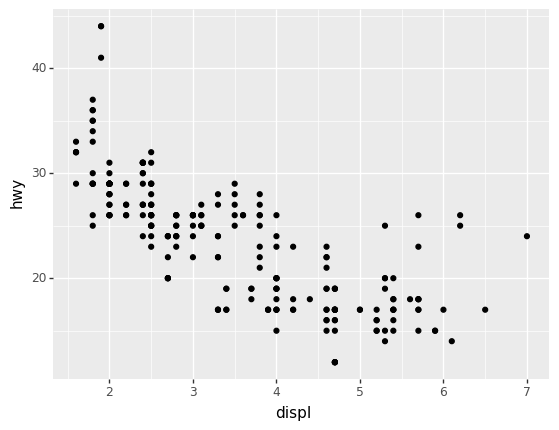

<ggplot: (95544573742)>

In [4]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy"))

### Постройте два графика: в одном из них одна из осей должна соответствовать столбцу с элементами-категориями, во втором – обе (например, "class" и "drv")


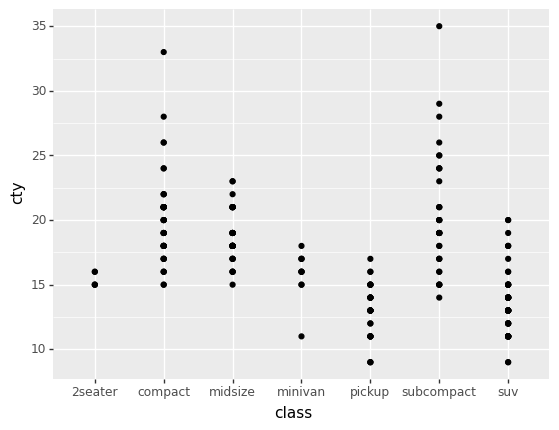

<ggplot: (95544760134)>

In [5]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="class", y="cty"))

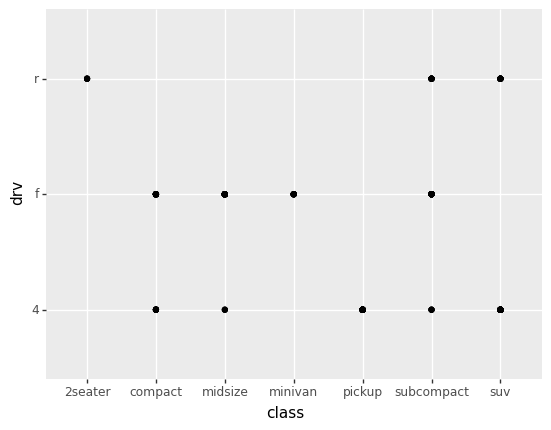

<ggplot: (95544670865)>

In [6]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="class", y="drv"))

## Добавим красок, оттенков и форм в графики

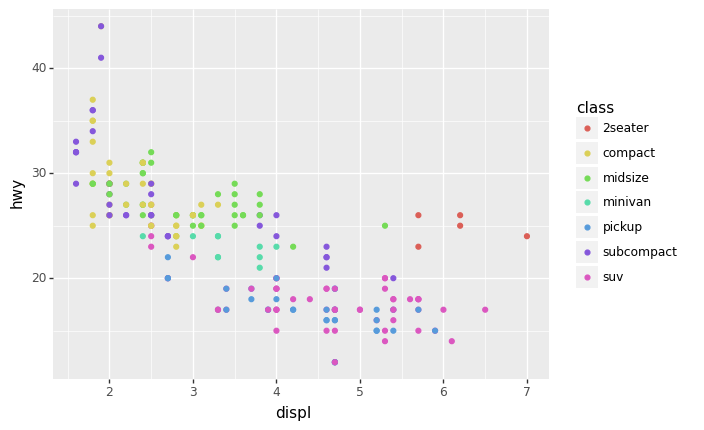

<ggplot: (95544707115)>

In [7]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy", color="class"))

d:\Programs\Conda\lib\site-packages\plotnine\scales\scale_alpha.py:68: PlotnineWarning: Using alpha for a discrete variable is not advised.


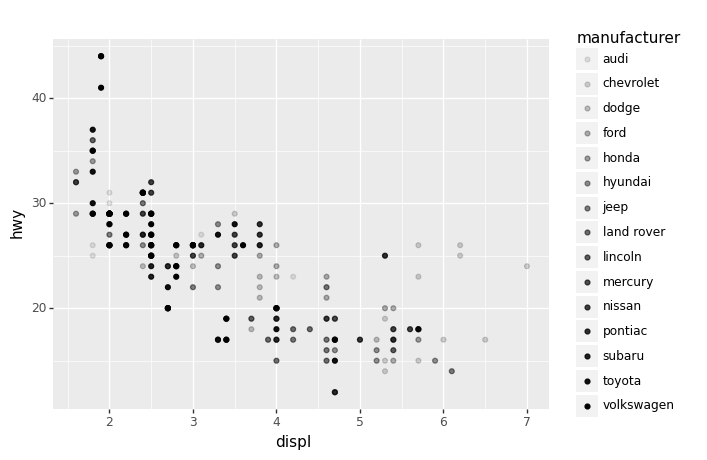

<ggplot: (95544703085)>

In [8]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy", alpha="manufacturer"))

d:\Programs\Conda\lib\site-packages\mizani\palettes.py:670: UserWarning: Palette can return a maximum of 13 values. 15 values requested.
d:\Programs\Conda\lib\site-packages\plotnine\layer.py:411: PlotnineWarning: geom_point : Removed 61 rows containing missing values.
d:\Programs\Conda\lib\site-packages\mizani\palettes.py:670: UserWarning: Palette can return a maximum of 13 values. 15 values requested.
d:\Programs\Conda\lib\site-packages\plotnine\guides\guides.py:253: PlotnineWarning: geom_point legend : Removed 2 rows containing missing values.


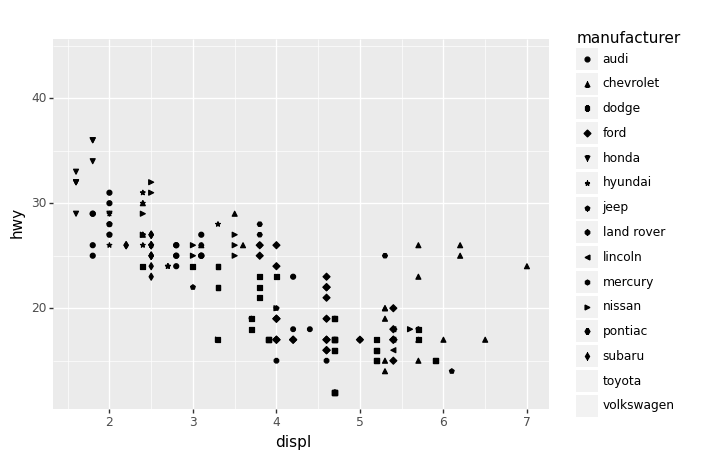

<ggplot: (95544850161)>

In [9]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy", shape="manufacturer"))

### Попробуйте сделать два графика: в одном размер точек будет соответствовать столбцу с элементами-категориями, во втором – столбцу с элементами-значениями

d:\Programs\Conda\lib\site-packages\plotnine\scales\scale_size.py:48: PlotnineWarning: Using size for a discrete variable is not advised.


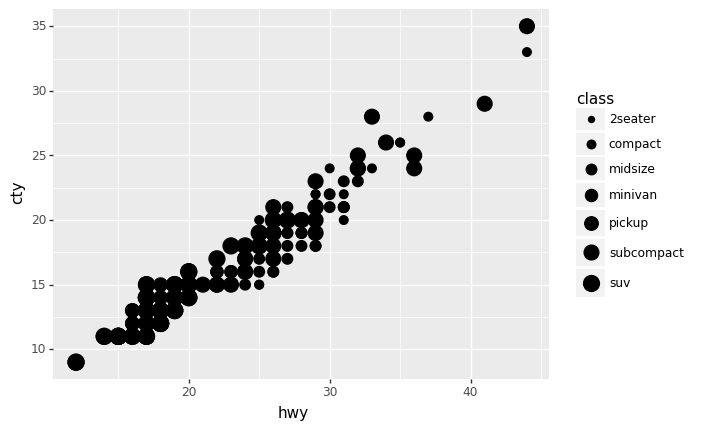

<ggplot: (95545019326)>

In [10]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="hwy", y="cty", size='class'))

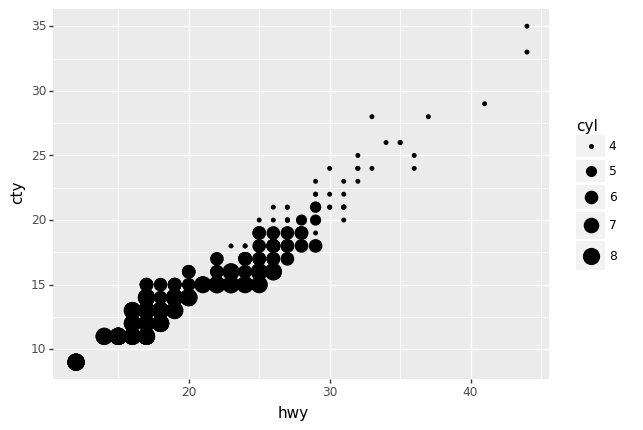

<ggplot: (95545014682)>

In [11]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="hwy", y="cty", size='cyl'))

## А что если сделать использовать в качестве источника визуального свойства "форма" непрерывную категорию (например hwy)?

Очевидно вылетит ошибка `Unrecognized marker style 12`, так как параметр shape принимает числа (символ формы) от 0 до 11 включительно.

In [51]:
# My code
try:
    plot = ggplot(data=mpg) +\
    geom_point(mapping=aes(x="hwy", y="cty", shape='hwy'))
    print(plot)
except ValueError as e:
    print(e)


Unrecognized marker style 12


### Попробуйте сделать график с визуальным элементом, заданным условным оператором (например, color="displ < 5")

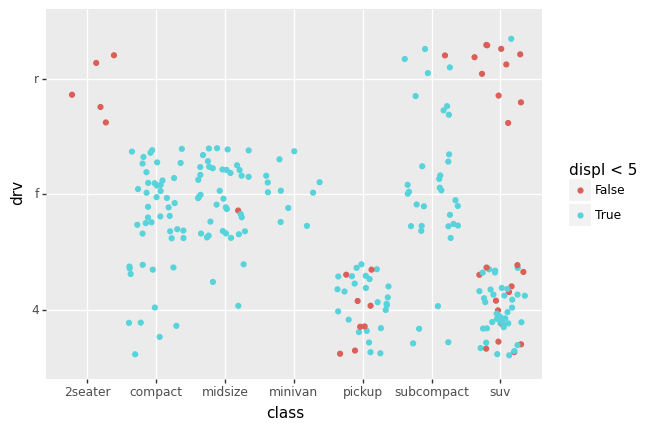

<ggplot: (95544950504)>

In [53]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="class", y="drv", color='displ < 5'), position='jitter')

### Попробуйте поэкспериментировать с графиками, где одной категории соответствуют различные визуальные элементы (пример ниже). Попробуйте привести пример, когда это имеет смысл.

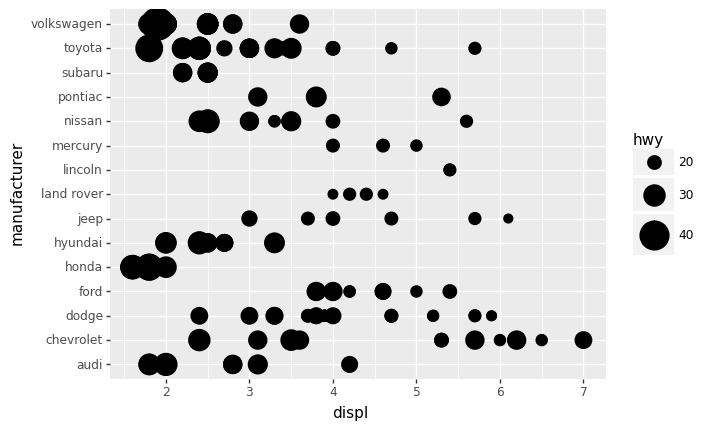

<ggplot: (95545703485)>

In [15]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="manufacturer", stroke="hwy"))

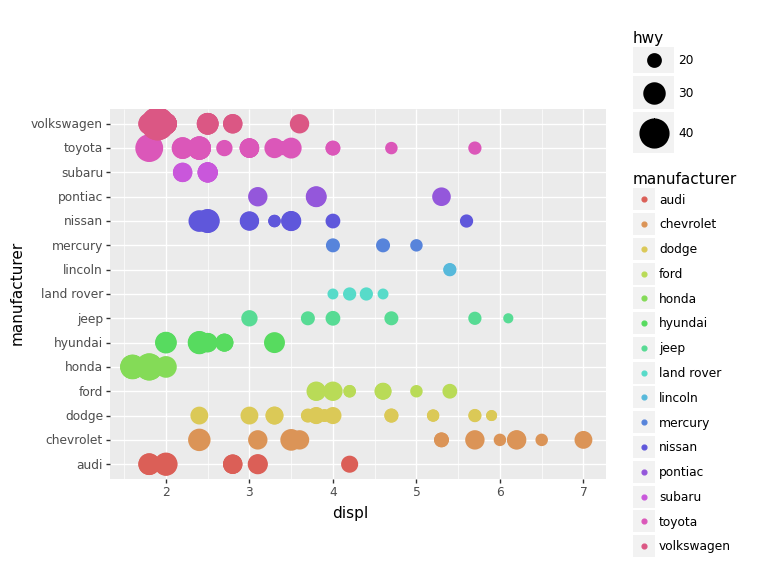

<ggplot: (95545024506)>

In [16]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="manufacturer", stroke="hwy", color="manufacturer"))

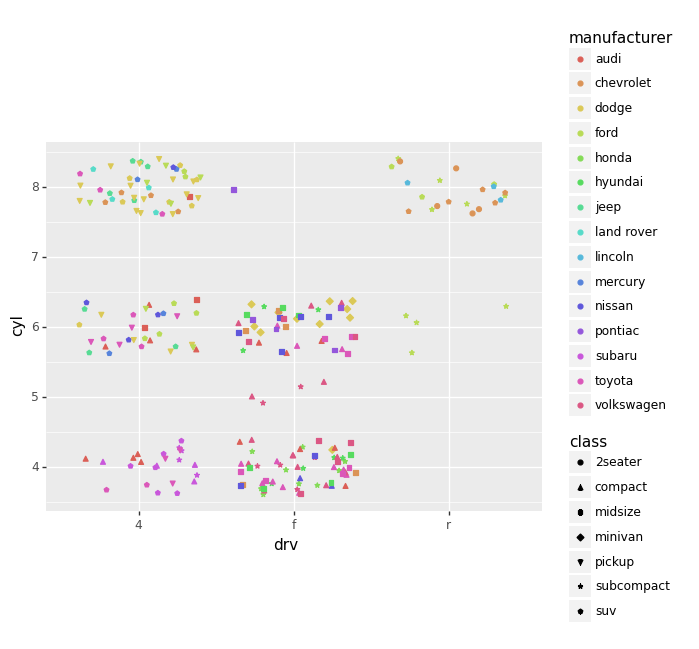

<ggplot: (95545790570)>

In [17]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="drv", y="cyl", color='manufacturer', shape='class'), position='jitter')

## Использование панелей при визуализации

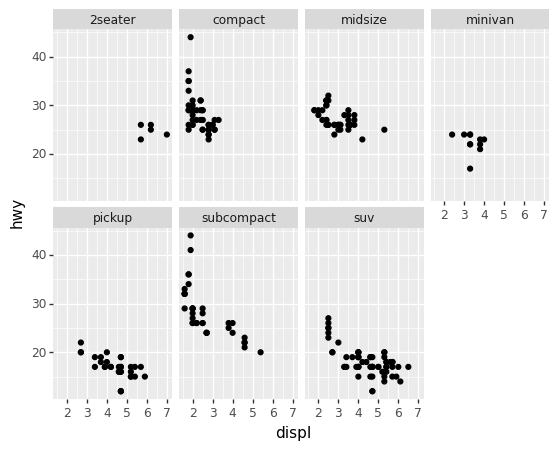

<ggplot: (95544974306)>

In [18]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy")) +\
facet_wrap("class", nrow=2)

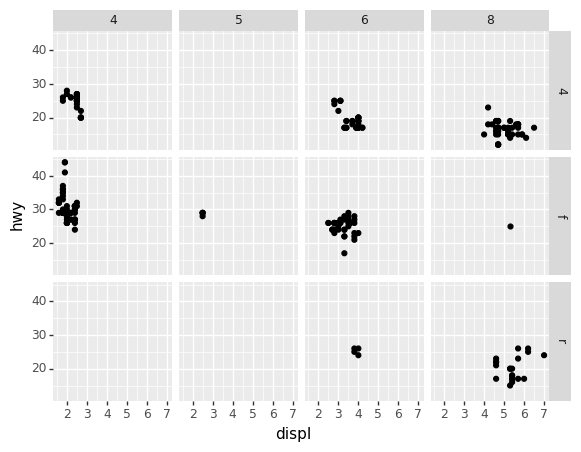

<ggplot: (95545827678)>

In [19]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy")) +\
facet_grid("drv ~ cyl")

### Что если использовать категорию с непрерывными значениями (например, hwy) для разделения на панели?

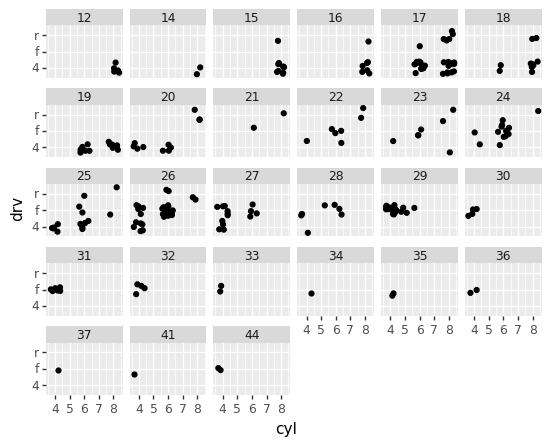

<ggplot: (95546502105)>

In [20]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="cyl", y="drv"), position='jitter') +\
facet_wrap("hwy")

### Можно сделать только вертикальные или только горизонтальные панели, если использовать конструкцию типа (". ~ <категория>")

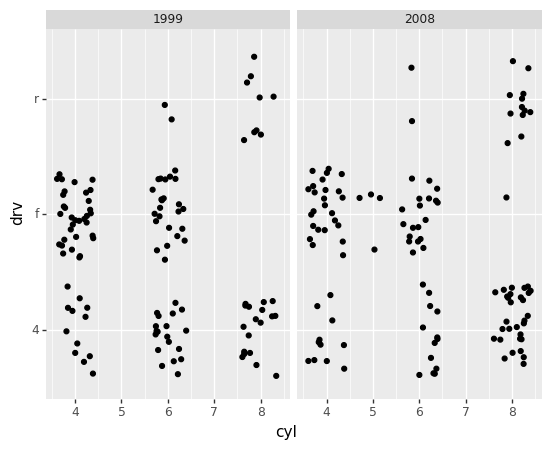

<ggplot: (95546312036)>

In [21]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="cyl", y="drv"), position='jitter') +\
facet_grid('. ~ year')

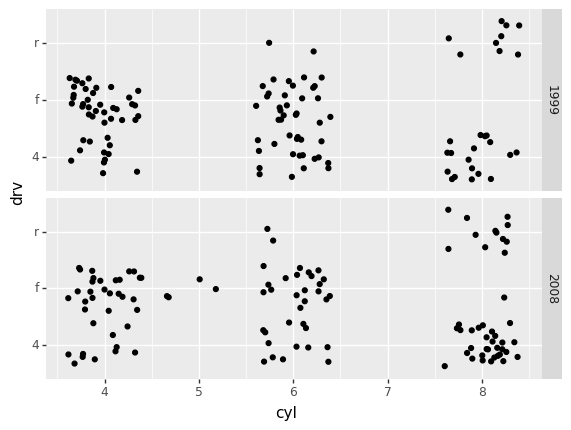

<ggplot: (95545304501)>

In [22]:
# My code
ggplot(data=mpg) +\
geom_point(mapping=aes(x="cyl", y="drv"), position='jitter') +\
facet_grid('year ~ .')

### Что лучше использовать: цвета или панели? А для большого набора?

Ответ: Ну если не критично наложение распределения нескольких групп точек друг на друга, то достаточно разделить их цветом. В противном случае - использовать панели. 


## geom_smooth() позволяет получить сглаженную среднюю (в том числе, с доверительным интервалом).abs
### (это не сработает без библиотеки scikit-misc, и может не сработать даже с ней)

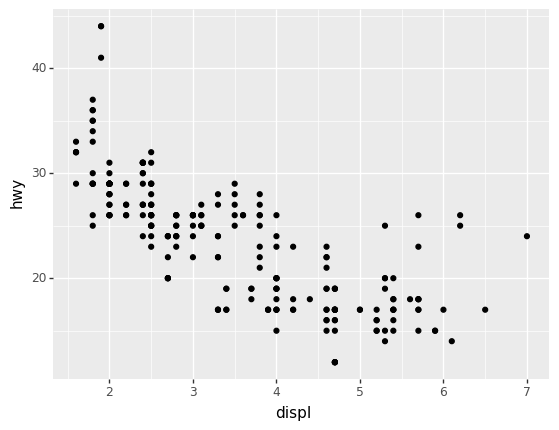

<ggplot: (95545480741)>

In [23]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy"))

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


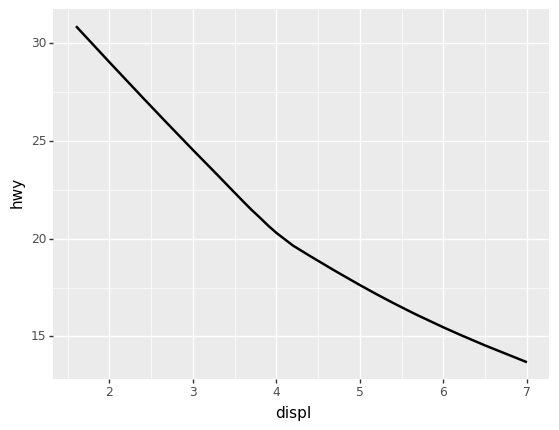

<ggplot: (95545542861)>

In [24]:
ggplot(data=mpg) +\
geom_smooth(mapping=aes(x="displ", y="hwy"))

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


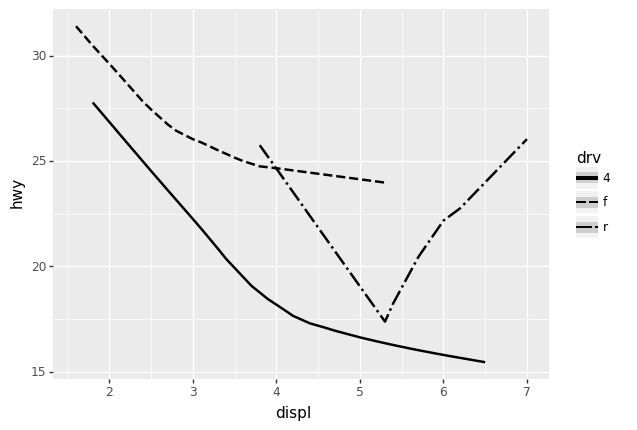

<ggplot: (95545753875)>

In [25]:
ggplot(data=mpg) +\
geom_smooth(mapping=aes(x="displ", y="hwy", linetype="drv"))

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


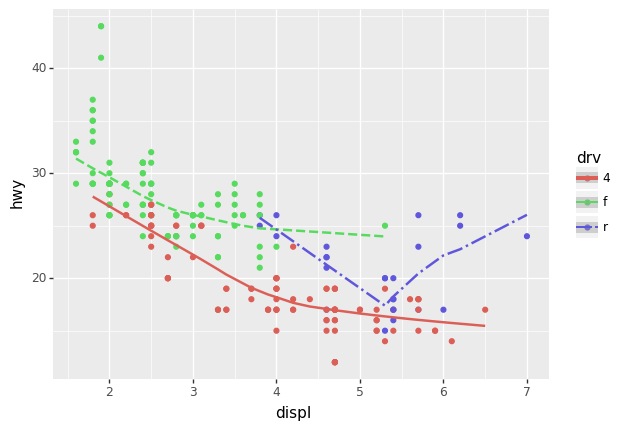

<ggplot: (95545863605)>

In [26]:
ggplot(data=mpg, mapping=aes(x="displ", y="hwy", color="drv")) +\
geom_point() +\
geom_smooth(mapping=aes(linetype="drv"))

## Визуальные отображения в функции ggplot будут распространяться на все графики. Отдельные свойства каждого геометрического отображения будут относиться только к нему.

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


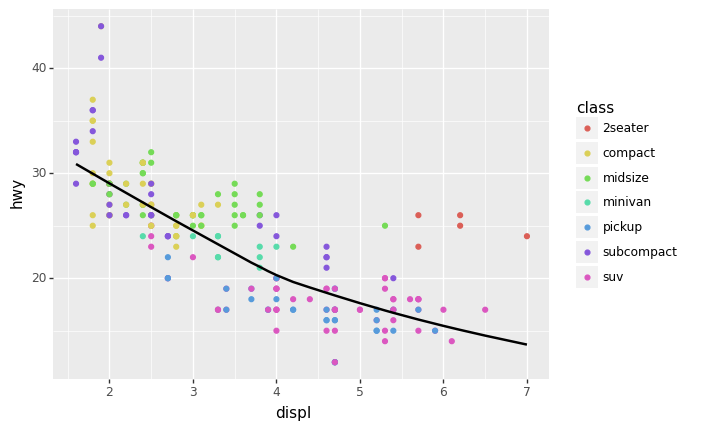

<ggplot: (95545541054)>

In [27]:
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point(mapping=aes(color="class")) +\
geom_smooth()

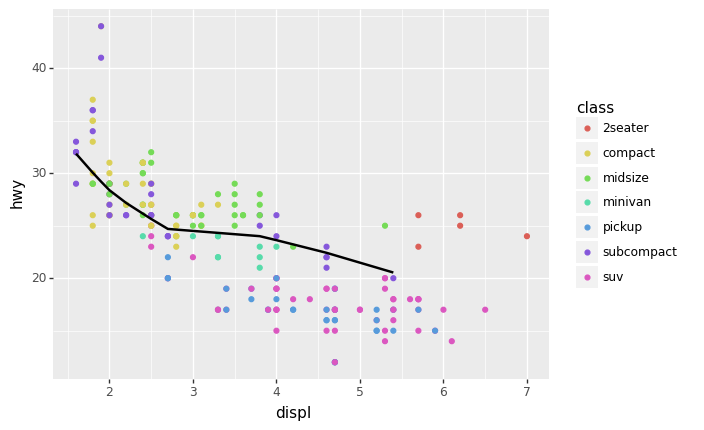

<ggplot: (95545542840)>

In [28]:
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point(mapping=aes(color="class")) +\
geom_smooth(data=mpg.loc[mpg["class"] == "subcompact"], se=False)

## Попробуйте скомбинировать разные свойства разных слоёв

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


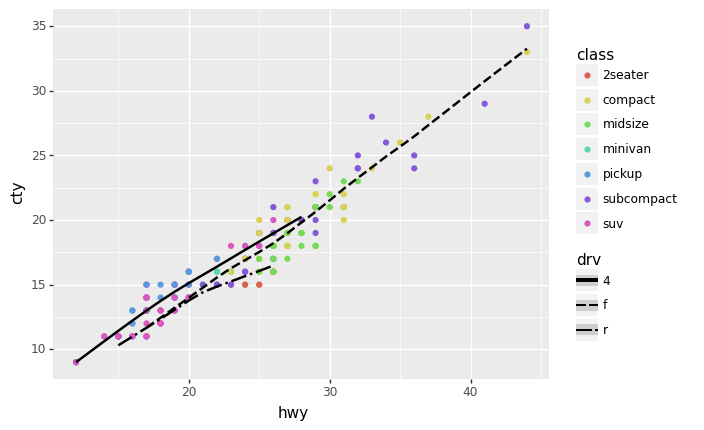

<ggplot: (177079755237)>

In [ ]:
# My code
ggplot(data=mpg, mapping=aes(x="hwy", y="cty")) +\
geom_point(mapping=aes(color="class")) +\
geom_smooth(mapping=aes(linetype="drv"))

# Какое геометрическое отображение вы будете использовать, чтобы нарисовать линейную диаграмму (обычный линейный график)?

`geom_line`

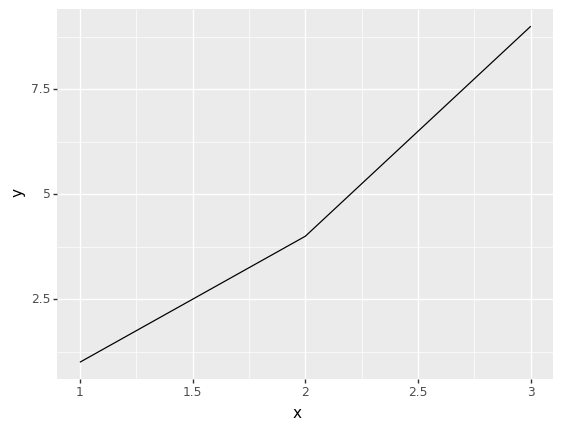

<ggplot: (177080006533)>

In [ ]:
# My code
ggplot(data=pd.DataFrame({'x':[1,2,3], 'y':[1,4,9]})) +\
geom_line(mapping=aes(x="x", y="y"))

### Подберите подходящий код под следующие графики:
<img src="supp/p1.png" alt="Drawing" style="width: 350px;"/>
<img src="supp/p2.png" alt="Drawing" style="width: 350px;"/></br>
<img src="supp/p3.png" alt="Drawing" style="width: 350px;"/>
<img src="supp/p4.png" alt="Drawing" style="width: 350px;"/></br>
<img src="supp/p5.png" alt="Drawing" style="width: 350px;"/>
<img src="supp/p6.png" alt="Drawing" style="width: 350px;"/>

Примечание: Графики кривых могут отличаться от соответствующих на изображении, но суть не меняется.

P.s. Предположу, что это из-за разных версий библиотеки

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


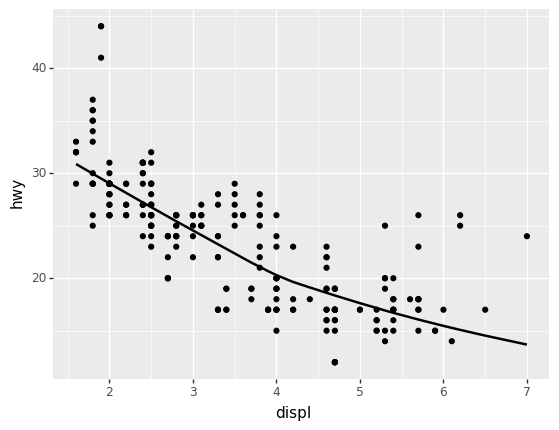

<ggplot: (95548539245)>

In [35]:
# My code 1
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point() +\
geom_smooth()

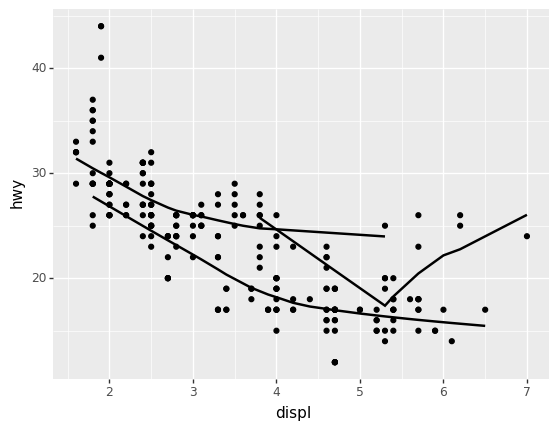

<ggplot: (95548611006)>

In [39]:
# My code 2
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point() +\
geom_smooth(data=mpg[mpg["drv"] == "4"], se=False) +\
geom_smooth(data=mpg[mpg["drv"] == "f"], se=False) +\
geom_smooth(data=mpg[mpg["drv"] == "r"], se=False)


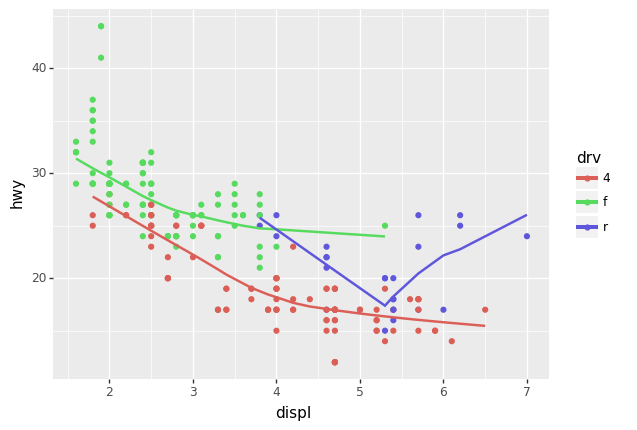

<ggplot: (95548706570)>

In [40]:
# My code 3
ggplot(data=mpg, mapping=aes(x="displ", y="hwy", color='drv')) +\
geom_point() +\
geom_smooth(data=mpg[mpg["drv"] == "4"], se=False) +\
geom_smooth(data=mpg[mpg["drv"] == "f"], se=False) +\
geom_smooth(data=mpg[mpg["drv"] == "r"], se=False)

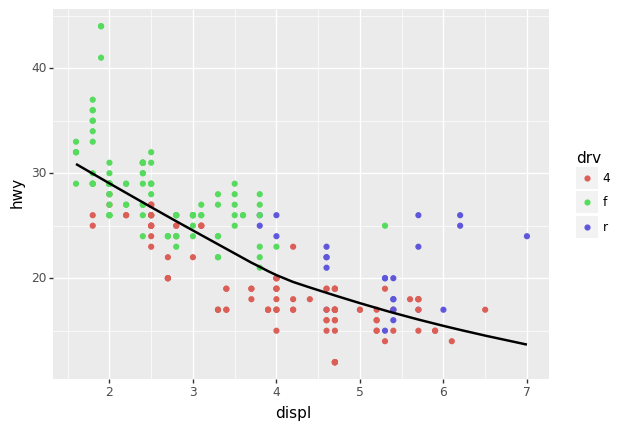

<ggplot: (95545473380)>

In [47]:
# My code 4
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point(mapping=aes(color='drv')) +\
geom_smooth(se=False)

d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.
d:\Programs\Conda\lib\site-packages\plotnine\stats\smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


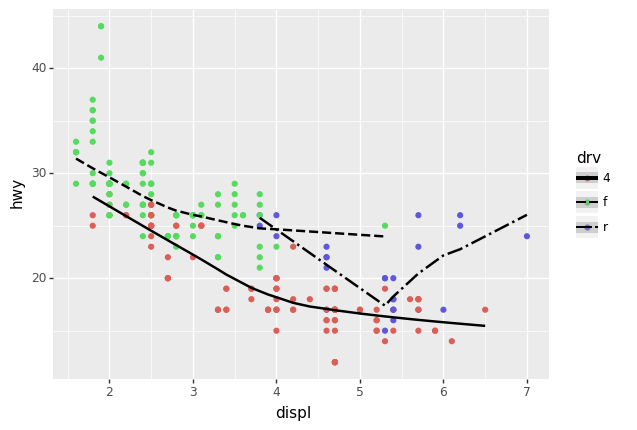

<ggplot: (95548721869)>

In [45]:
# My code 5
ggplot(data=mpg, mapping=aes(x="displ", y="hwy")) +\
geom_point(mapping=aes(color='drv')) +\
geom_smooth(mapping=aes(linetype='drv'))

Примечание: не понимаю откуда и зачем белый фон вокруг точек. Надеюсь обычного выделения по цвету будет достаточно

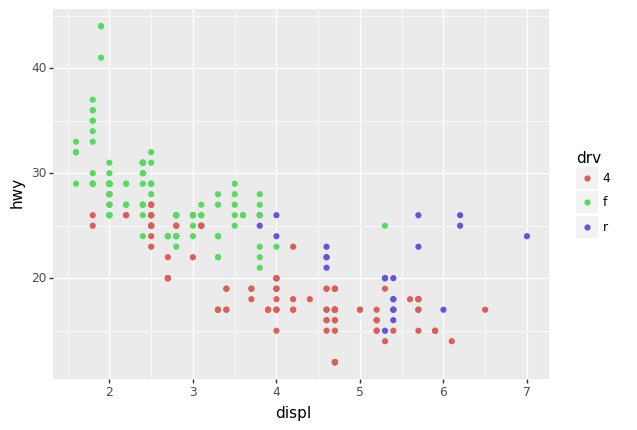

<ggplot: (95545724932)>

In [80]:
# My code 6
ggplot(data=mpg, mapping=aes(x="displ", y="hwy", color='drv')) +\
geom_point()

## Статистические свойства элементов категорий

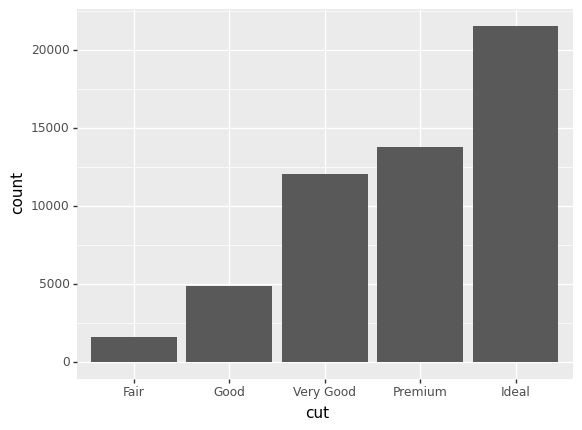

<ggplot: (95546402991)>

In [59]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut"))

### Что делает geom_col()? Чем он отличается от geom_bar()?

Это альтернативная версия geom_bar, которая сопоставляет высоту столбцов с существующей переменной в ваших данных. 

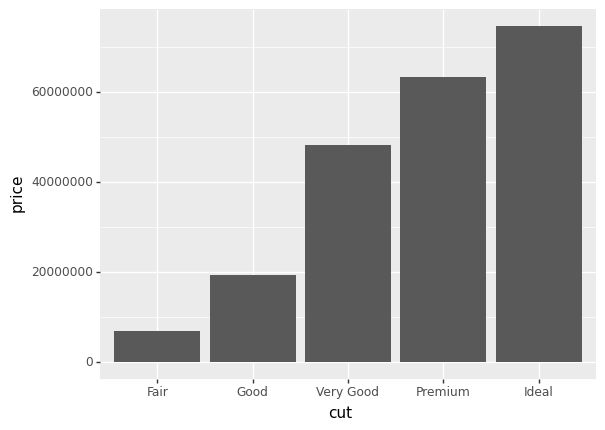

<ggplot: (95546163300)>

In [62]:
ggplot(data=diamonds) +\
geom_col(mapping=aes(x="cut", y='price'))

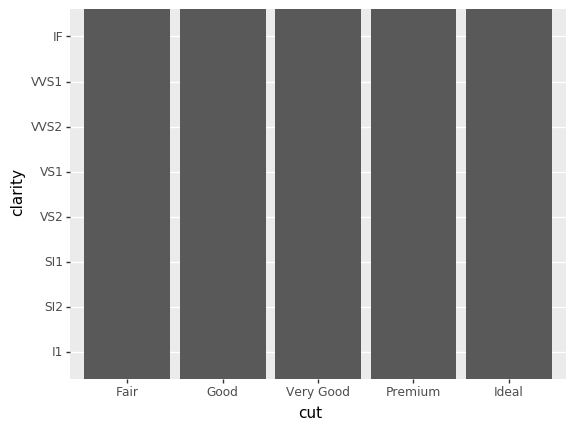

<ggplot: (-9223371871807350972)>

In [ ]:
ggplot(data=diamonds) +\
geom_col(mapping=aes(x="cut", y="clarity"))

### Что произойдёт, если 
'ggplot(data=diamonds) +\
'geom_bar(mapping=aes(x="cut", y="..prop.."), group=1)
или
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", fill="color", y="..prop.."))
### запустить без "group=1"? Почему?

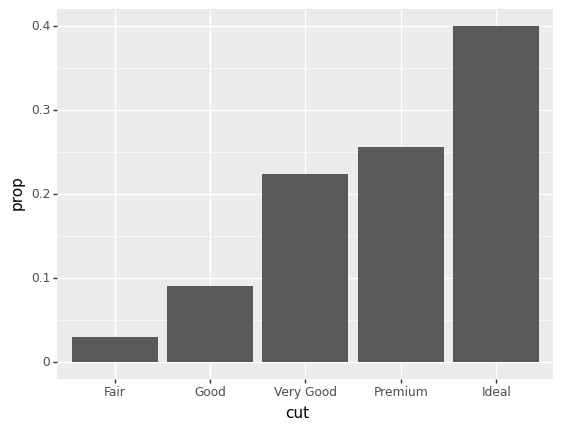

<ggplot: (95545732356)>

In [63]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", y="..prop.."), group=1)

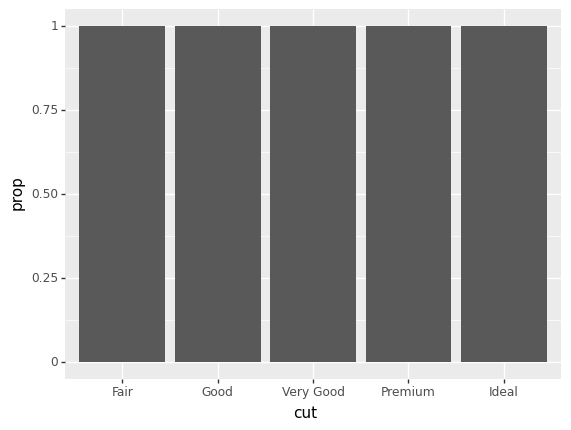

<ggplot: (95549931099)>

In [71]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", y="..prop.."))

## Модные графики с красивыми цветами

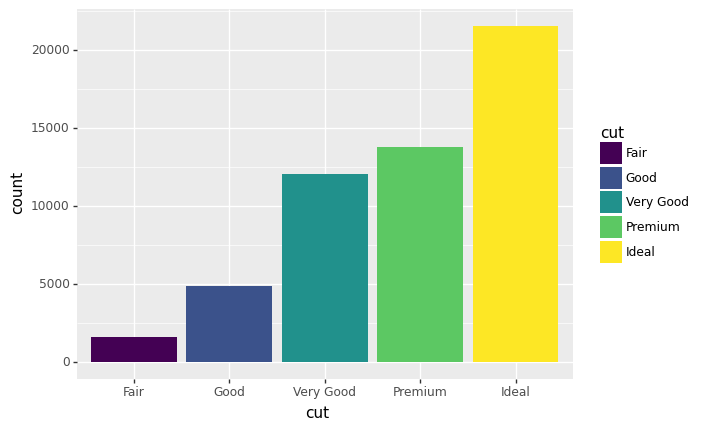

<ggplot: (95548789571)>

In [65]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", fill="cut"))

## При добавлении новых категорий в качестве цвета появляется новая функциональность

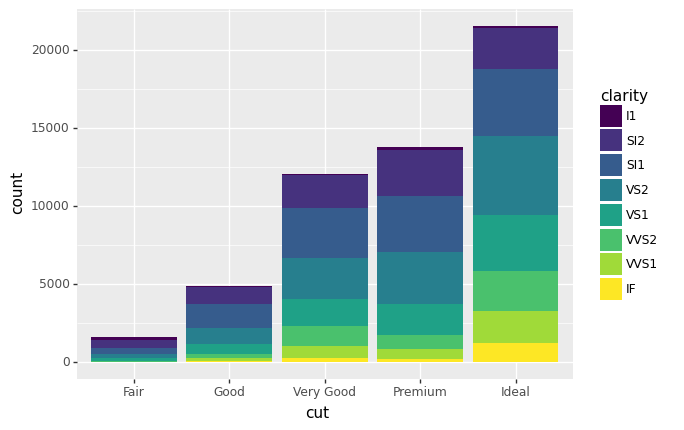

<ggplot: (95548854086)>

In [66]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", fill="clarity"))

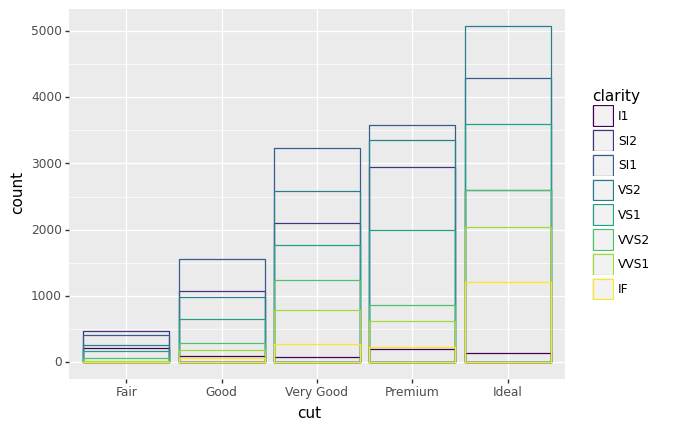

<ggplot: (95548713421)>

In [67]:
ggplot(data=diamonds, mapping=aes(x="cut", colour="clarity")) +\
geom_bar(fill=None, position="identity")

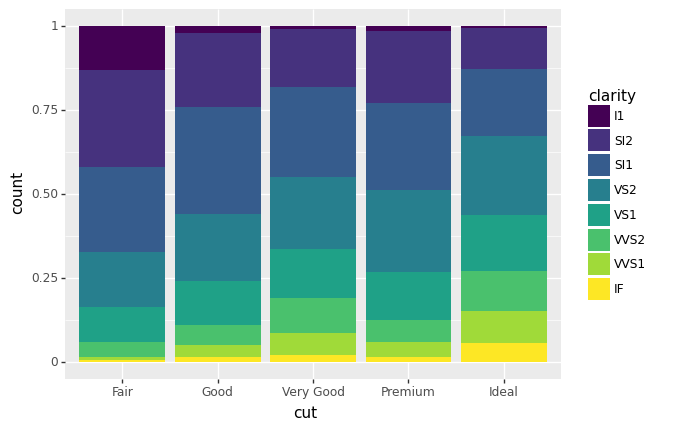

<ggplot: (95545572072)>

In [68]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", fill="clarity"), position="fill")

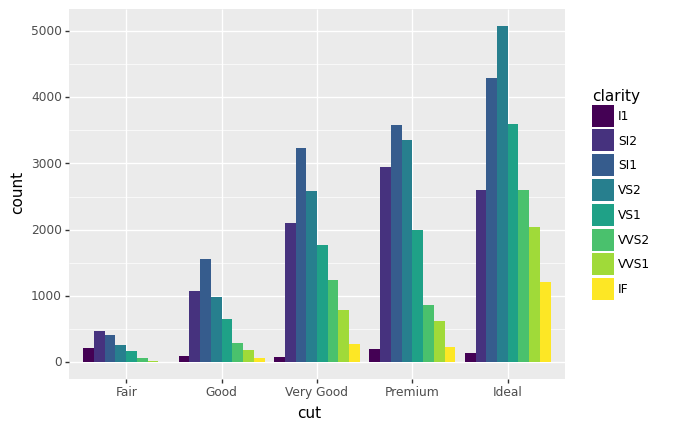

<ggplot: (95548496243)>

In [72]:
ggplot(data=diamonds) +\
geom_bar(mapping=aes(x="cut", fill="clarity"), position="dodge")

## Добавим jitter в scatter!

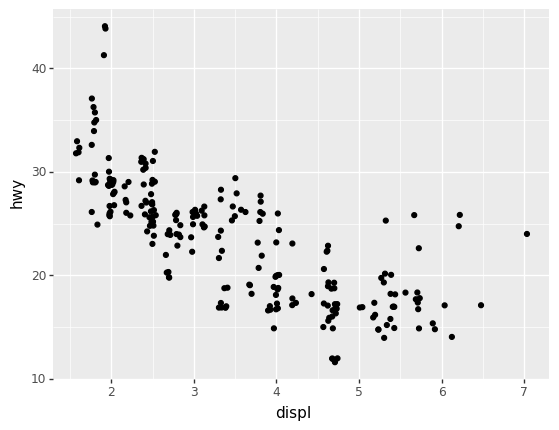

<ggplot: (-9223371871808166468)>

In [ ]:
ggplot(data=mpg) +\
geom_point(mapping=aes(x="displ", y="hwy"), position="jitter")


### Зачем тут coord_fixed()? Что делает geom_abline()?

* coord_fixed - Cartesian coordinates with fixed relationship between x and y scales,
* geom_abline - Lines specified by slope and intercept

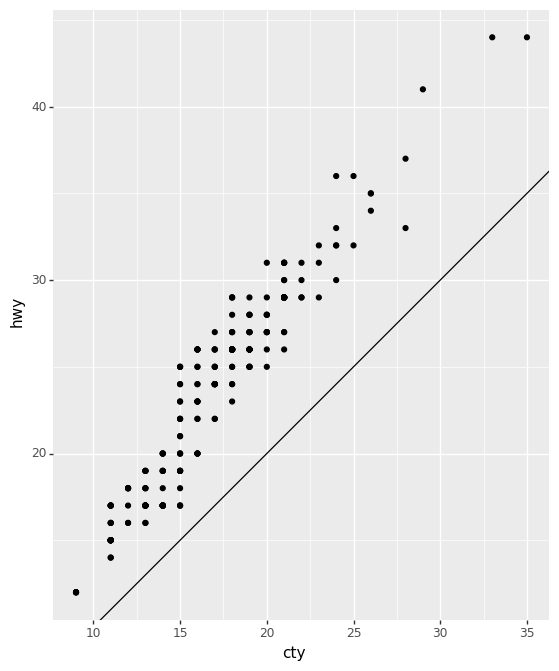

<ggplot: (95545770783)>

In [87]:
ggplot(data=mpg, mapping=aes(x="cty", y="hwy")) +\
geom_point() +\
geom_abline() +\
coord_fixed()


# Творческое задание
## Попробуйте использовать изученные средства plotnine для своего датасета (необязательно много и пока не надо строить сложные графики)

In [ ]:
data = pd.read_csv("../data/Star_dataset.csv")
data

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color,Spectral Class
0,3068,0.002400,0.1700,16.12,0,red,M
1,3042,0.000500,0.1542,16.60,0,red,M
2,2600,0.000300,0.1020,18.70,0,red,M
3,2800,0.000200,0.1600,16.65,0,red,M
4,1939,0.000138,0.1030,20.06,0,red,M
...,...,...,...,...,...,...,...
235,38940,374830.000000,1356.0000,-9.93,5,blue,O
236,30839,834042.000000,1194.0000,-10.63,5,blue,O
237,8829,537493.000000,1423.0000,-10.73,5,white,A
238,9235,404940.000000,1112.0000,-11.23,5,white,A


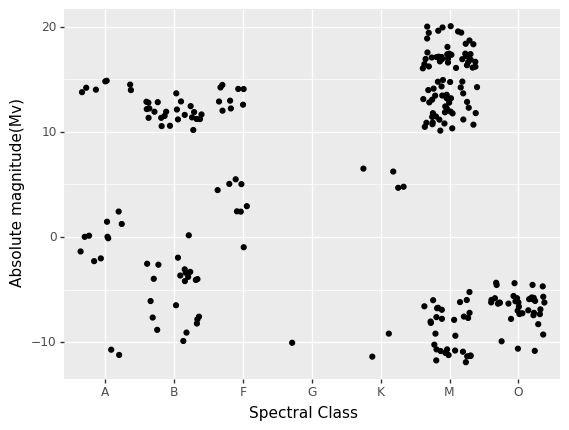

<ggplot: (136957040514)>

In [ ]:
ggplot(data=data) +\
geom_point(mapping=aes(x='Spectral Class', y="Absolute magnitude(Mv)"), position='jitter')

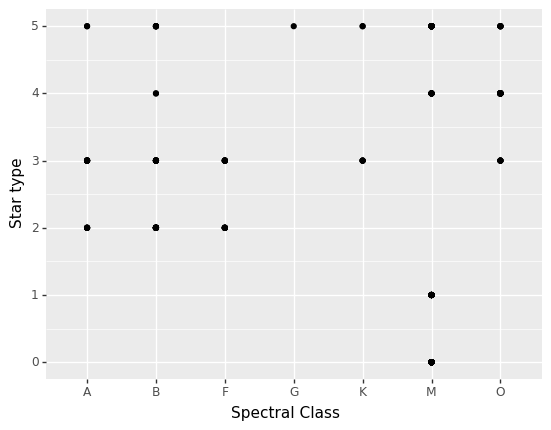

<ggplot: (136955687557)>

In [ ]:
ggplot(data=data) +\
geom_point(mapping=aes(x='Spectral Class', y="Star type"))

d:\Programs\Conda\lib\site-packages\plotnine\scales\scale_size.py:48: PlotnineWarning: Using size for a discrete variable is not advised.


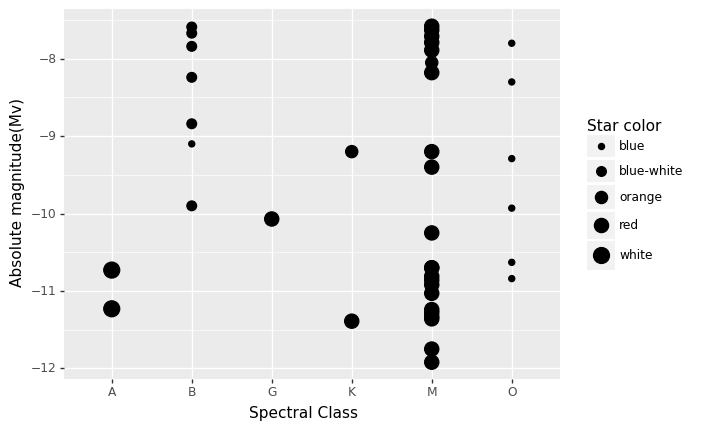

<ggplot: (136957430658)>

In [ ]:
ggplot(data=data[data['Star type'] == 5]) +\
geom_point(mapping=aes(x='Spectral Class', y="Absolute magnitude(Mv)", size='Star color'))

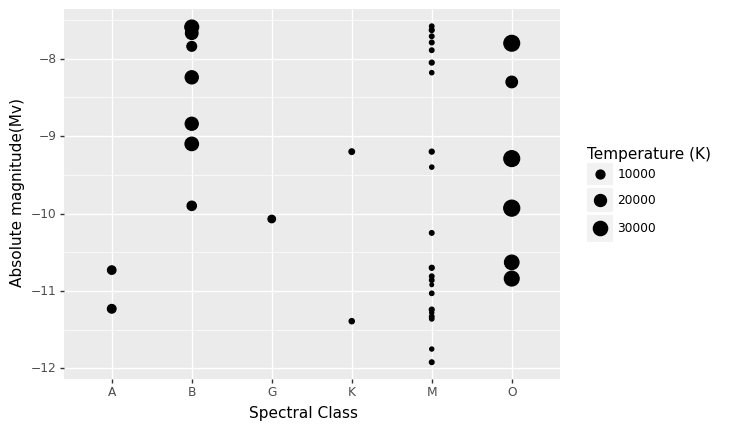

<ggplot: (136957194608)>

In [ ]:
ggplot(data=data[data['Star type'] == 5]) +\
geom_point(mapping=aes(x='Spectral Class', y="Absolute magnitude(Mv)", size="Temperature (K)"))

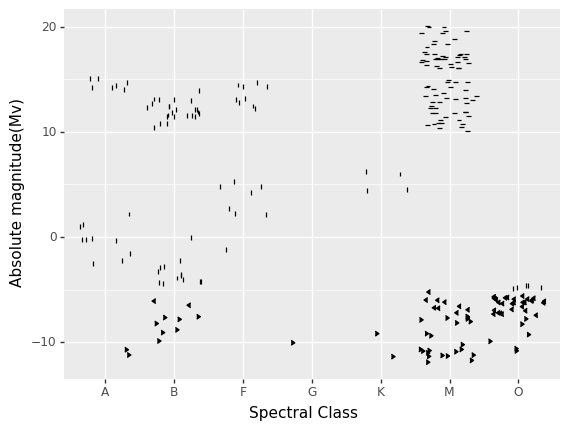

<ggplot: (136955619166)>

In [ ]:
ggplot(data=data) +\
geom_point(mapping=aes(x='Spectral Class', y="Absolute magnitude(Mv)", shape="Star type"), position='jitter')